# Processamento de Imagens - Análise de Parafusos e Porcas

Este notebook implementa técnicas básicas de visão computacional com base no conteúdo da aula. As etapas incluem:

1. **Carregamento da Imagem**.
2. **Conversão para Níveis de Cinza**.
3. **Binarização: Simples e Método de Otsu**.
4. **Visualização das Etapas**.
        

# Membros






In [ ]:
# Monta o drive para acessar fotos
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# importar bibliotecas
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob


# Nova seção

In [ ]:
# Encontra imagens na pasta especificada com extensões válidas.
def encontrar_imagens(pasta, exts=['*.jpg', '*.jpeg', '*.png']):
    imagens = []
    for ext in exts:
        imagens.extend(glob(os.path.join(pasta, ext)))
    return imagens


In [ ]:
# Carrega e redimensiona a imagem; converte para tons de cinza e aplica blur.
def carregar_e_preprocessar_imagem(caminho, tamanho=(600, 400)):
    img = cv2.imread(caminho)
    if img is None:
        return None, None
    img = cv2.resize(img, tamanho)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
    return img, img_blur

In [ ]:
# Detecta contornos com Canny e aplica fechamento morfológico.
def detectar_contornos(img_blur):
    bordas = cv2.Canny(img_blur, 50, 150)
    kernel = np.ones((5, 5), np.uint8)
    fechado = cv2.morphologyEx(bordas, cv2.MORPH_CLOSE, kernel)
    contornos, _ = cv2.findContours(fechado, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contornos_filtrados = [c for c in contornos if cv2.contourArea(c) > 100]
    return contornos_filtrados

In [ ]:
#Desenha os contornos encontrados na imagem original.
def desenhar_contornos(img_original, contornos):
    img_com_contornos = img_original.copy()
    cv2.drawContours(img_com_contornos, contornos, -1, (0, 100, 0), 2)
    return img_com_contornos

In [ ]:
#Exibe a imagem com título e contagem de objetos.
def mostrar_resultado(img_rgb, nome_arquivo, quantidade):
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f'{nome_arquivo} - Objetos detectados: {quantidade}')
    plt.axis('off')
    plt.show()

In [ ]:
# Pré-processamento e detecção de contornos e visualização
def processar_lote_de_imagens(pasta):

    imagens = encontrar_imagens(pasta)
    if not imagens:
        print("❌ Nenhuma imagem encontrada.")
        return

    print(f"🔍 {len(imagens)} imagem(ns) encontrada(s).\n")

    for caminho in imagens:
        nome = os.path.basename(caminho)
        print(f"🖼️ Processando: {nome}")

        img, img_blur = carregar_e_preprocessar_imagem(caminho)
        if img is None:
            print("⚠️ Erro ao carregar imagem.")
            continue

        contornos = detectar_contornos(img_blur)
        quantidade = len(contornos)
        print(f"✅ Objetos detectados: {quantidade}")

        img_contornada = desenhar_contornos(img, contornos)
        img_rgb = cv2.cvtColor(img_contornada, cv2.COLOR_BGR2RGB)
        mostrar_resultado(img_rgb, nome, quantidade)

🔍 25 imagem(ns) encontrada(s).

🖼️ Processando: img_parafusos_04.jpg
✅ Objetos detectados: 19


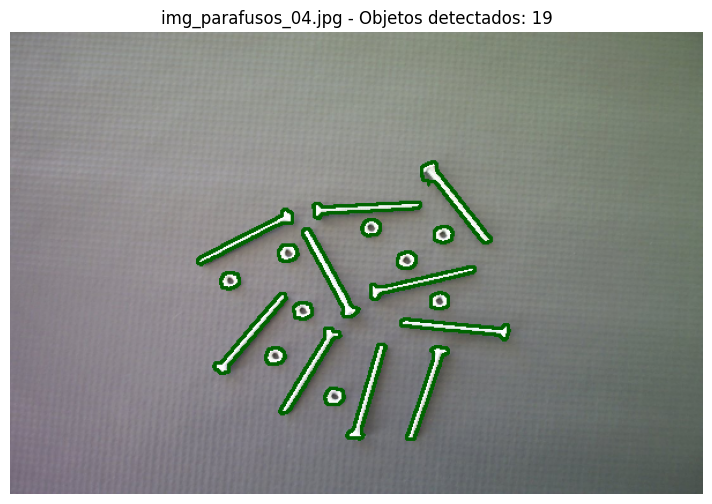

🖼️ Processando: img_parafusos_03.jpg
✅ Objetos detectados: 12


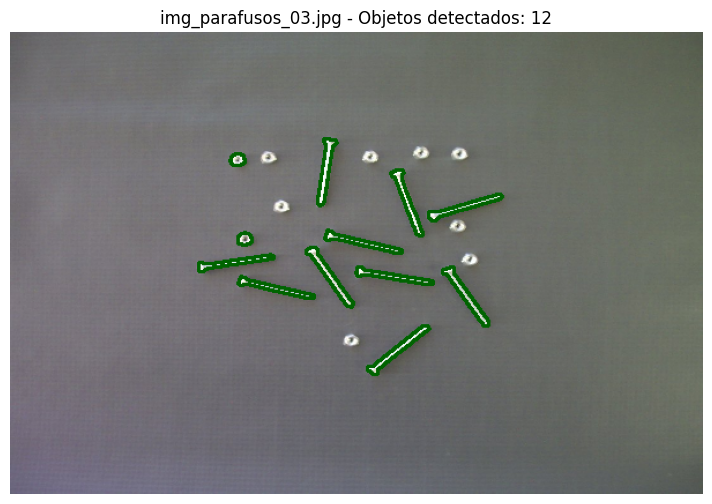

🖼️ Processando: img01.jpg
✅ Objetos detectados: 20


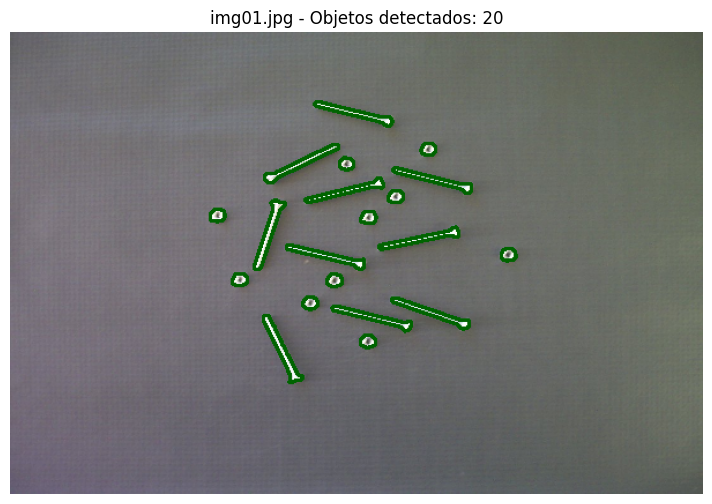

🖼️ Processando: img_parafusos_05.jpg
✅ Objetos detectados: 14


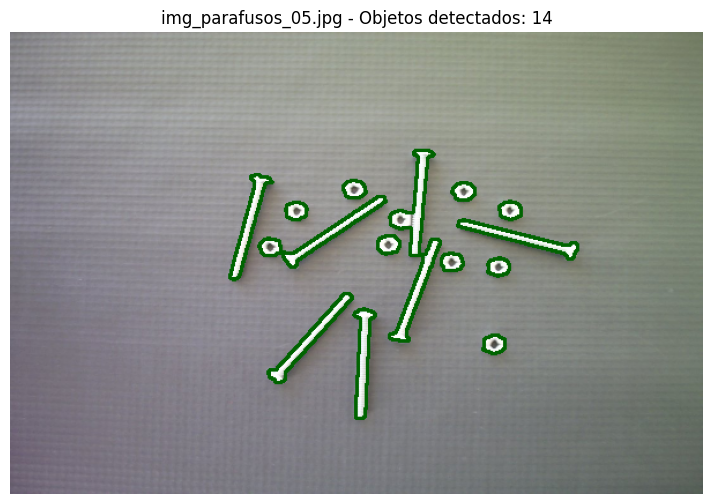

🖼️ Processando: img03.jpg
✅ Objetos detectados: 12


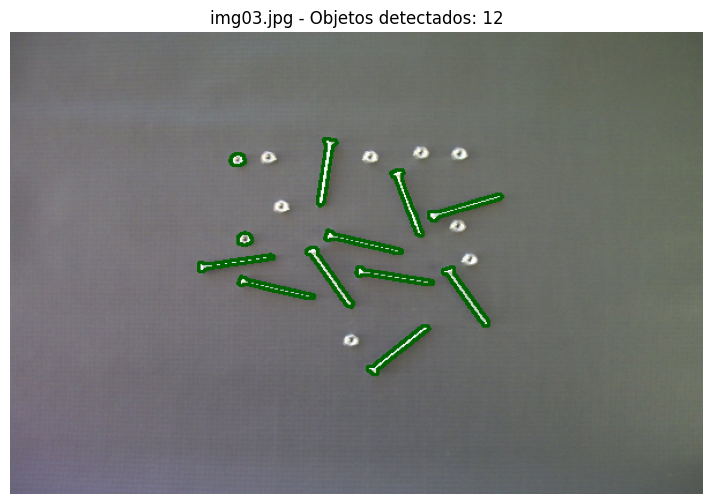

🖼️ Processando: img04.jpg
✅ Objetos detectados: 15


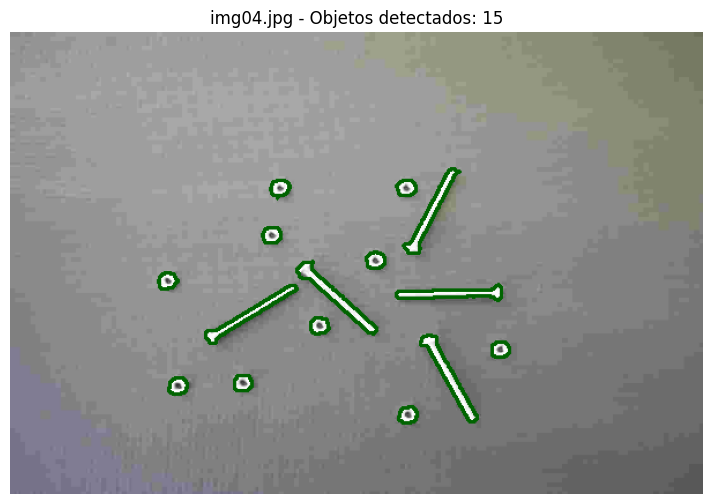

🖼️ Processando: img_parafusos_01.jpg
✅ Objetos detectados: 20


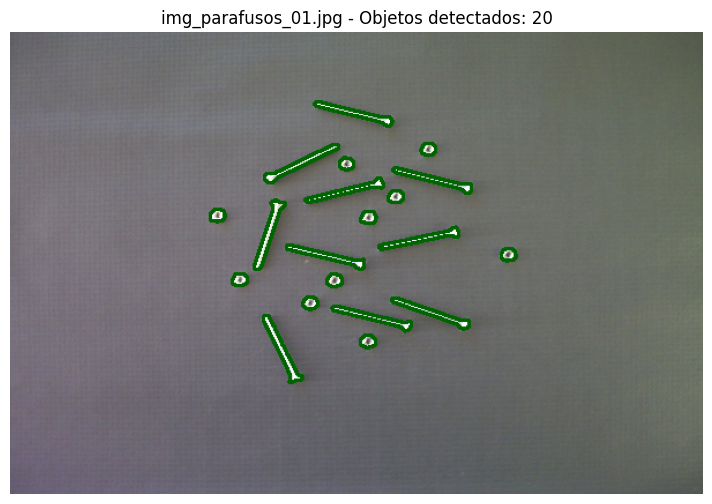

🖼️ Processando: img_parafusos_02 - Copia.jpg
✅ Objetos detectados: 19


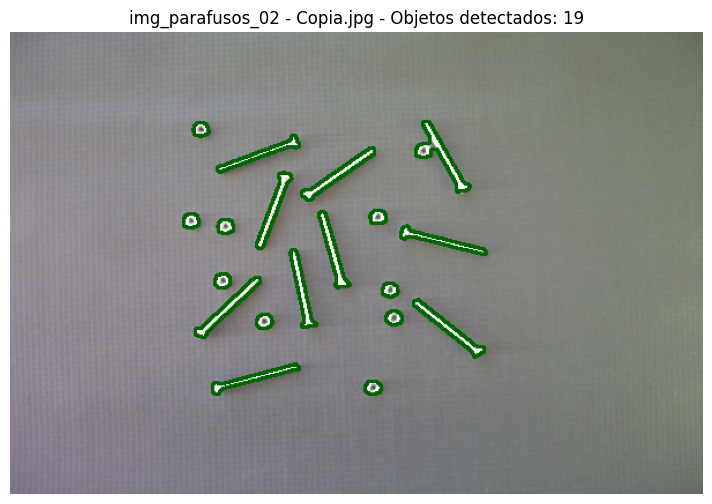

🖼️ Processando: img_parafusos_02.jpg
✅ Objetos detectados: 19


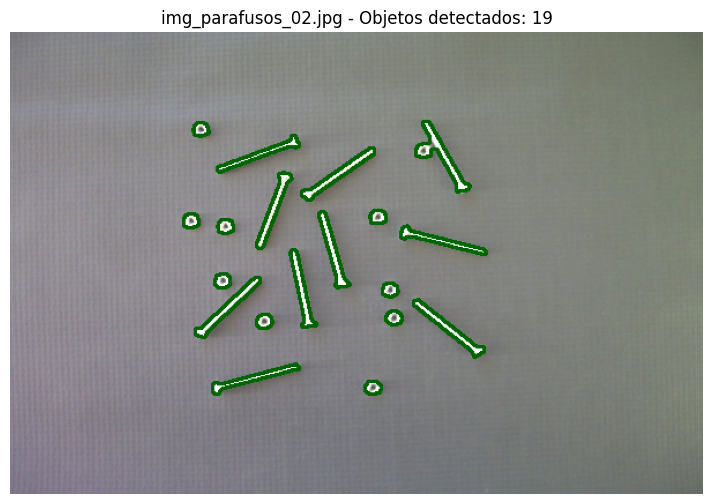

🖼️ Processando: img02 - Copia.jpg
✅ Objetos detectados: 19


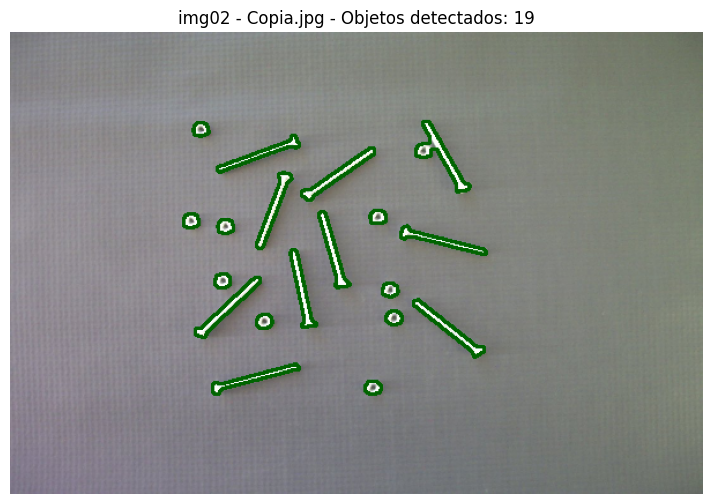

🖼️ Processando: img02.jpg
✅ Objetos detectados: 19


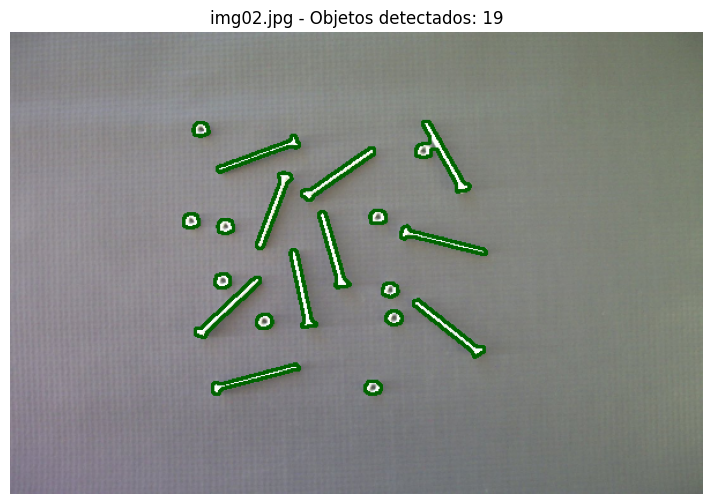

🖼️ Processando: img08 - Copia.jpg
✅ Objetos detectados: 14


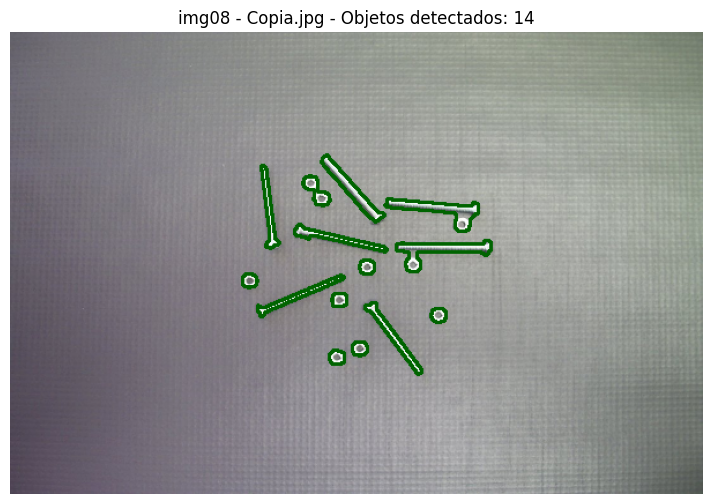

🖼️ Processando: img10 - Copia.jpg
✅ Objetos detectados: 19


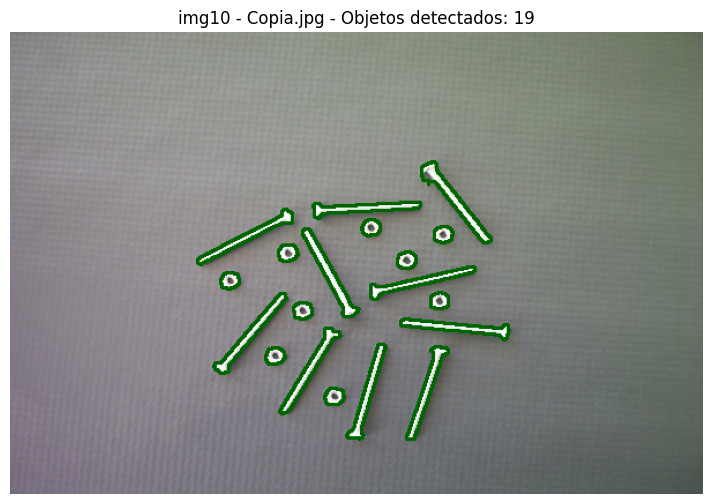

🖼️ Processando: img08.jpg
✅ Objetos detectados: 14


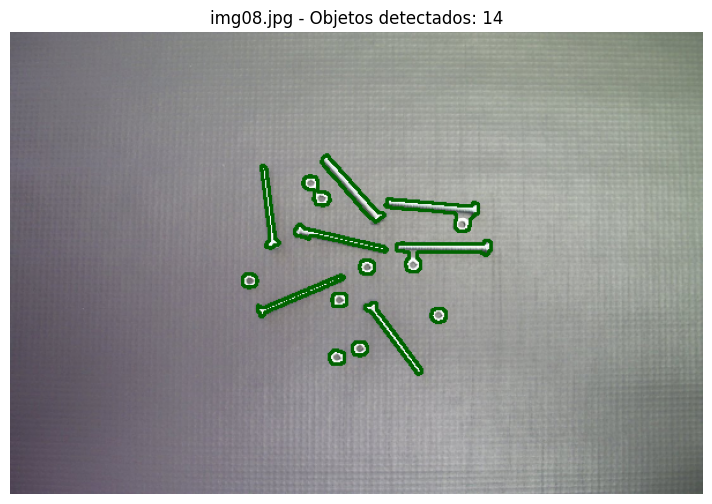

🖼️ Processando: img10.jpg
✅ Objetos detectados: 19


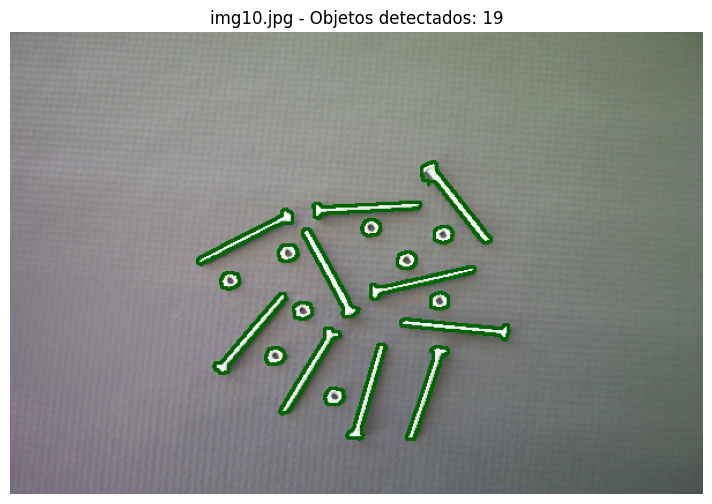

🖼️ Processando: img05 - Copia.jpg
✅ Objetos detectados: 15


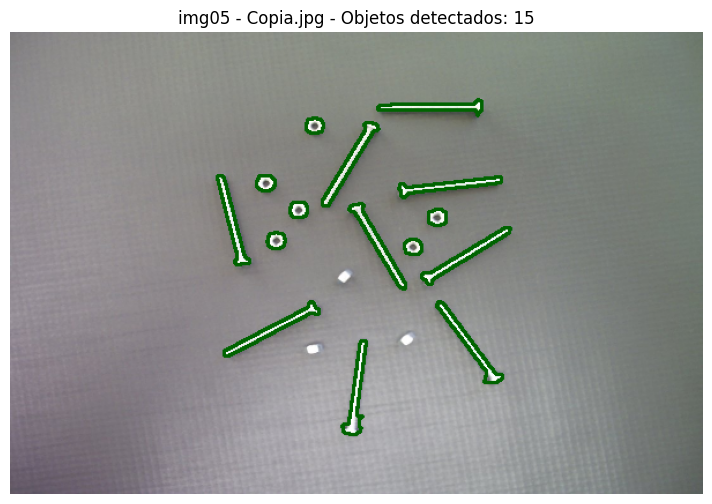

🖼️ Processando: img05.jpg
✅ Objetos detectados: 15


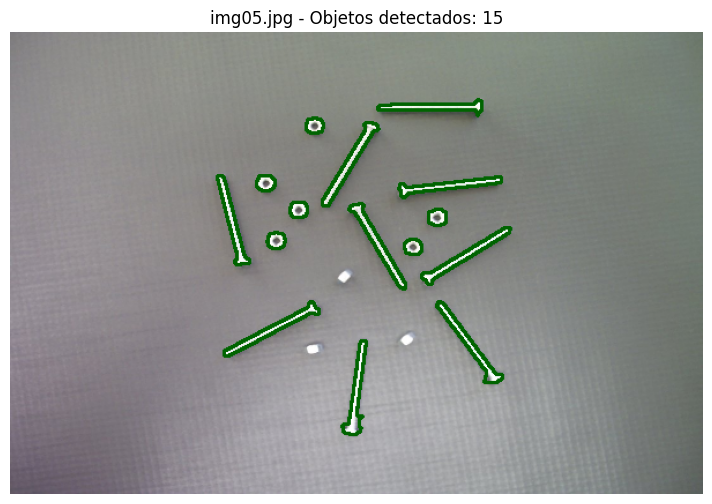

🖼️ Processando: img06 - Copia.jpg
✅ Objetos detectados: 20


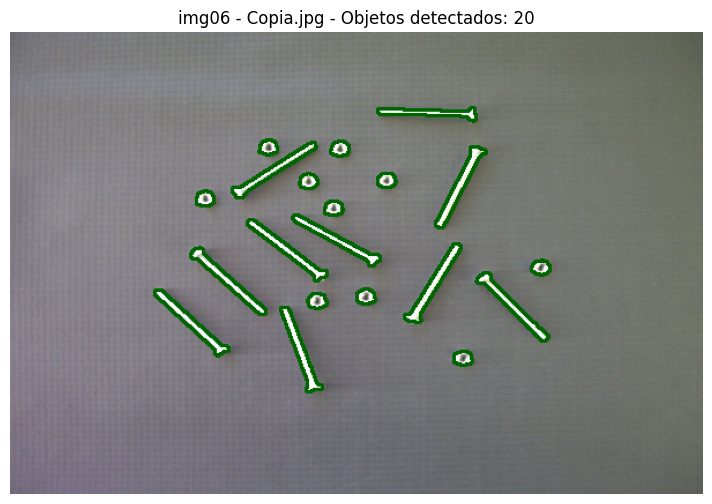

🖼️ Processando: img06.jpg
✅ Objetos detectados: 20


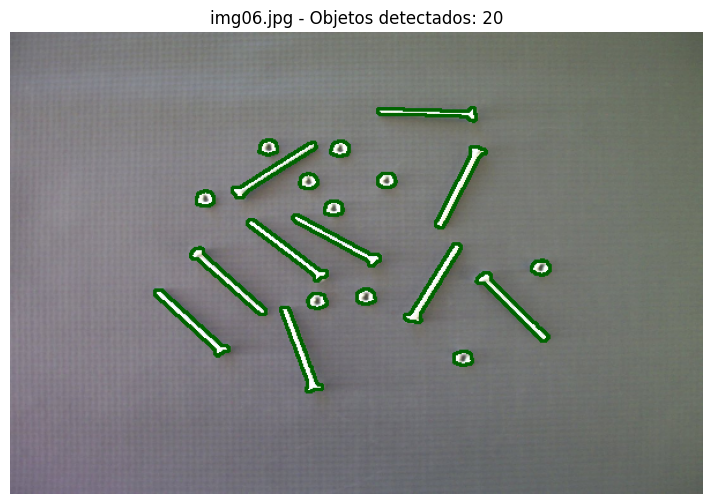

🖼️ Processando: img07 - Copia.jpg
✅ Objetos detectados: 14


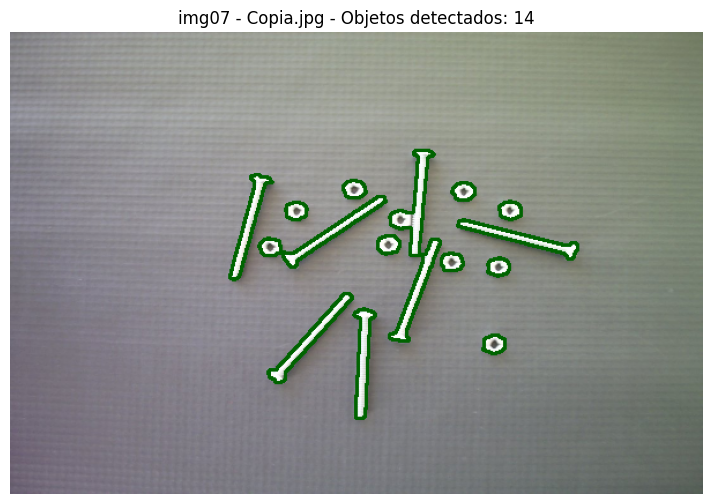

🖼️ Processando: img07.jpg
✅ Objetos detectados: 14


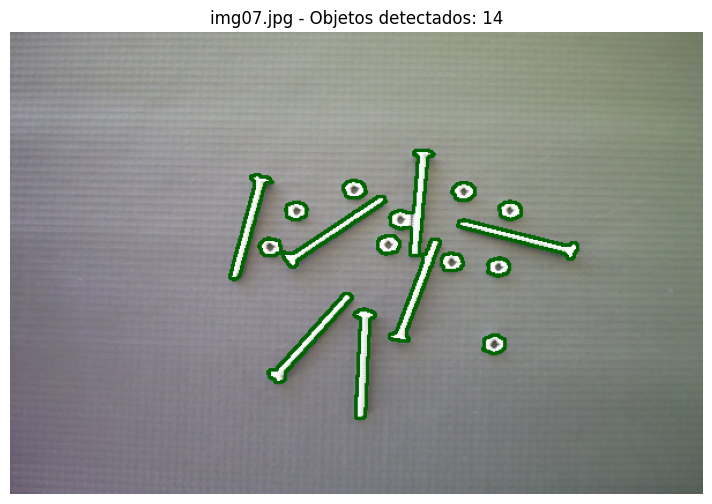

🖼️ Processando: img09 - Copia.jpg
✅ Objetos detectados: 20


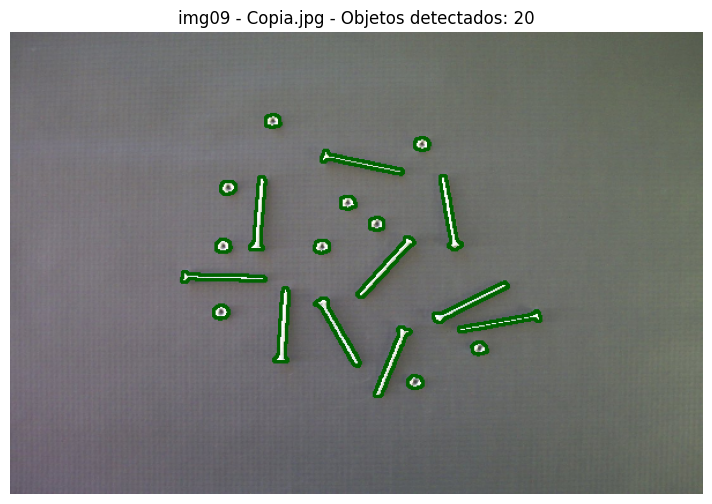

🖼️ Processando: img09.jpg
✅ Objetos detectados: 20


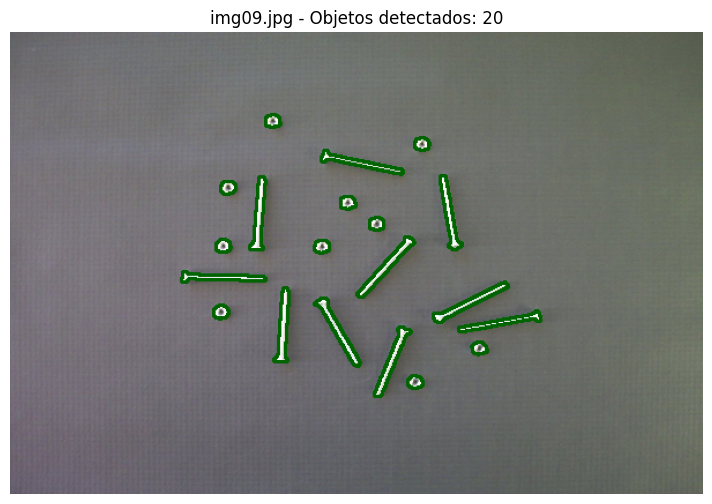

🖼️ Processando: parafusos - Copia.jpg
✅ Objetos detectados: 20


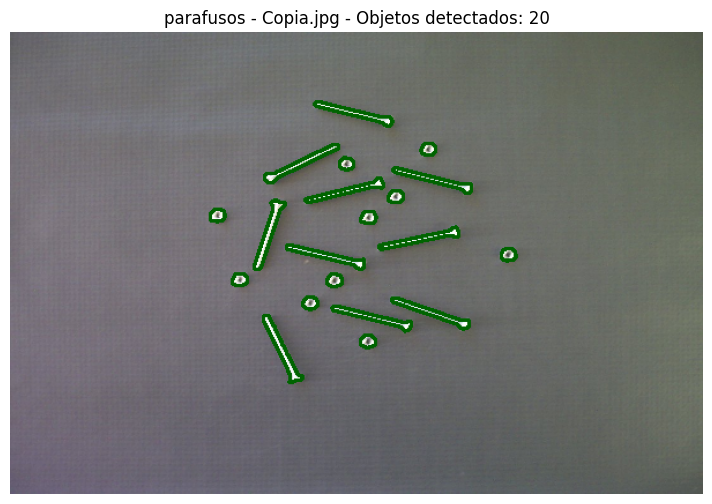

🖼️ Processando: parafusos.jpg
✅ Objetos detectados: 20


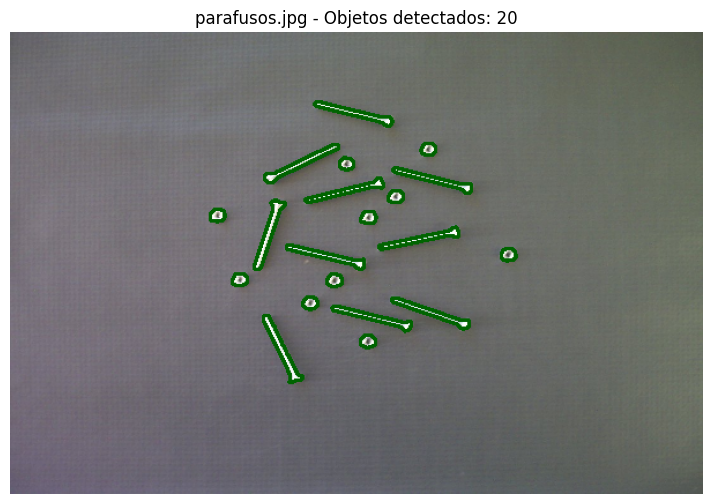

In [ ]:
#Inicialização
if __name__ == "__main__":
  pasta = '/content/drive/MyDrive/Colab Notebooks/Atividades Pos graduaçao/imagens_processamento'
  processar_lote_de_imagens(pasta)